In [2]:
!pip install ucimlrepo
from ucimlrepo import fetch_ucirepo
!wget -q -O "TimesNewRoman.ttf" "https://raw.githubusercontent.com/justrajdeep/fonts/master/Times%20New%20Roman.ttf"

import matplotlib
import matplotlib.font_manager as font_manager
import shutil
shutil.rmtree(matplotlib.get_cachedir(), ignore_errors=True)

font_manager.fontManager.addfont("TimesNewRoman.ttf")

# fetch dataset
banknote_authentication = fetch_ucirepo(id=267)

# features and target
X = banknote_authentication.data.features
y = banknote_authentication.data.targets

# metadata
print(banknote_authentication.metadata)

# variable information
print(banknote_authentication.variables)

{'uci_id': 267, 'name': 'Banknote Authentication', 'repository_url': 'https://archive.ics.uci.edu/dataset/267/banknote+authentication', 'data_url': 'https://archive.ics.uci.edu/static/public/267/data.csv', 'abstract': 'Data were extracted from images that were taken for the evaluation of an authentication procedure for banknotes.', 'area': 'Computer Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 1372, 'num_features': 4, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['class'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2012, 'last_updated': 'Fri Feb 16 2024', 'dataset_doi': '10.24432/C55P57', 'creators': ['Volker Lohweg'], 'intro_paper': None, 'additional_info': {'summary': 'Data were extracted from images that were taken from genuine and forged banknote-like specimens.  For digitization, an industrial camera usually used for print inspection was used. The final im

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Global Plot Formatting

plt.rcParams['savefig.dpi'] = 600
plt.rcParams['figure.dpi'] = 600

plt.rcParams['font.family'] = 'Times New Roman'

plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

plt.rcParams['axes.labelsize'] = 15
plt.rcParams['axes.titlesize'] = 15

plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15

plt.rcParams['legend.fontsize'] = 15

sns.set_style("whitegrid")
sns.set_context("notebook")

label_style = {
    'fontsize': 15,
    'fontweight': 'bold',
    'fontname': 'Times New Roman'
}

title_style = {
    'fontsize': 15,
    'fontweight': 'bold',
    'fontname': 'Times New Roman'
}

legend_style = {
    'family': 'Times New Roman',
    'weight': 'bold',
    'size': 15
}

def format_axis_ticks(current_axis):

    for tick_label in (
        current_axis.get_xticklabels()
        + current_axis.get_yticklabels()
    ):
        tick_label.set_fontweight('bold')
        tick_label.set_fontname('Times New Roman')

def format_legend_text(current_legend):

    if current_legend is not None:

        for legend_entry in current_legend.get_texts():
            legend_entry.set_fontweight('bold')
            legend_entry.set_fontname('Times New Roman')

        legend_title = current_legend.get_title()
        legend_title.set_fontweight('bold')
        legend_title.set_fontname('Times New Roman')

print(X.head())
print(y.head())

print("Feature Shape:", X.shape)
print("Target Shape:", y.shape)

   variance  skewness  curtosis  entropy
0   3.62160    8.6661   -2.8073 -0.44699
1   4.54590    8.1674   -2.4586 -1.46210
2   3.86600   -2.6383    1.9242  0.10645
3   3.45660    9.5228   -4.0112 -3.59440
4   0.32924   -4.4552    4.5718 -0.98880
   class
0      0
1      0
2      0
3      0
4      0
Feature Shape: (1372, 4)
Target Shape: (1372, 1)


In [ ]:
import pandas as pd

# combining features and target into a single dataframe
dataset = pd.concat([X, y], axis=1)

print("\nColumns in dataset:")
print(dataset.columns)

print("\nFirst five rows:")
print(dataset.head())


Columns in dataset:
Index(['variance', 'skewness', 'curtosis', 'entropy', 'class'], dtype='object')

First five rows:
   variance  skewness  curtosis  entropy  class
0   3.62160    8.6661   -2.8073 -0.44699      0
1   4.54590    8.1674   -2.4586 -1.46210      0
2   3.86600   -2.6383    1.9242  0.10645      0
3   3.45660    9.5228   -4.0112 -3.59440      0
4   0.32924   -4.4552    4.5718 -0.98880      0


In [ ]:
rows, cols = dataset.shape

print("\nDataset Information")
print(f"Number of samples  : {rows}")
print(f"Number of columns  : {cols}")


Dataset Information
Number of samples  : 1372
Number of columns  : 5


In [ ]:
print("\nMissing Values")
missing_entries = dataset.isnull().sum()

print(missing_entries)


Missing Values
variance    0
skewness    0
curtosis    0
entropy     0
class       0
dtype: int64


In [ ]:
print("\nData Types")
print(dataset.dtypes)


Data Types
variance    float64
skewness    float64
curtosis    float64
entropy     float64
class         int64
dtype: object


In [ ]:
print("\nStatistical Summary of the dataset")
statistics_table = dataset.describe()

print(statistics_table)


Statistical Summary of the dataset
          variance     skewness     curtosis      entropy        class
count  1372.000000  1372.000000  1372.000000  1372.000000  1372.000000
mean      0.433735     1.922353     1.397627    -1.191657     0.444606
std       2.842763     5.869047     4.310030     2.101013     0.497103
min      -7.042100   -13.773100    -5.286100    -8.548200     0.000000
25%      -1.773000    -1.708200    -1.574975    -2.413450     0.000000
50%       0.496180     2.319650     0.616630    -0.586650     0.000000
75%       2.821475     6.814625     3.179250     0.394810     1.000000
max       6.824800    12.951600    17.927400     2.449500     1.000000


In [ ]:
target_column = dataset.columns[-1]
print("\nClass Distribution")

print(dataset[target_column].value_counts())


Class Distribution
class
0    762
1    610
Name: count, dtype: int64


In [ ]:
class_percentages = (
    dataset[target_column]
    .value_counts(normalize=True) * 100
)

print("\nEach Class Percentage Distribution")
print(class_percentages)


Each Class Percentage Distribution
class
0    55.539359
1    44.460641
Name: proportion, dtype: float64


In [ ]:
# Saving dataset locally instead of taking from the internet everytime.
dataset.to_csv(
    "banknote_authentication.csv",
    index=False
)

print("\nDataset saved successfully.")


Dataset saved successfully.


In [ ]:
print(dataset.columns)

Index(['variance', 'skewness', 'curtosis', 'entropy', 'class'], dtype='object')


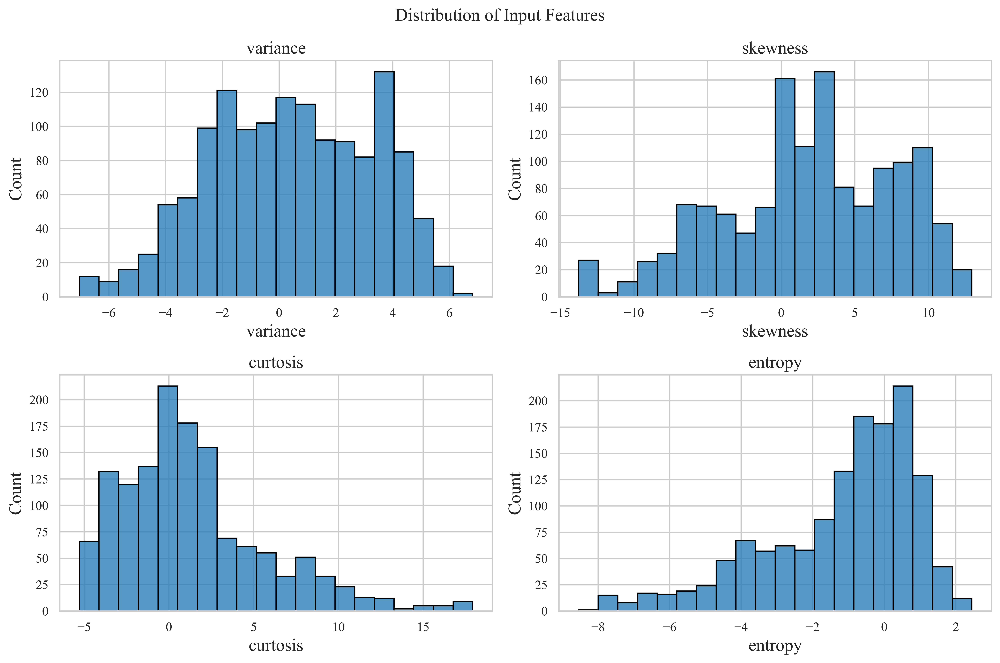

In [ ]:
# Task 2 : EDA
feature_columns = [
    "variance",
    "skewness",
    "curtosis",
    "entropy"
]
target_column = 'class'

feature_figure, feature_axes = plt.subplots(
    2, 2,
    figsize=(12, 8)
)

for current_axis, current_feature in zip(
    feature_axes.flatten(),
    feature_columns
):

    sns.histplot(
        dataset[current_feature],
        bins=20,
        edgecolor='black',
        ax=current_axis
    )

    current_axis.set_title(current_feature, **title_style)
    current_axis.set_xlabel(current_feature, **label_style)
    current_axis.set_ylabel("Count", **label_style)

    format_axis_ticks(current_axis)

feature_figure.suptitle(
    "Distribution of Input Features",
    fontsize=15,
    fontweight='bold',
    fontname='Times New Roman'
)

plt.tight_layout()

plt.savefig(
    "histograms.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

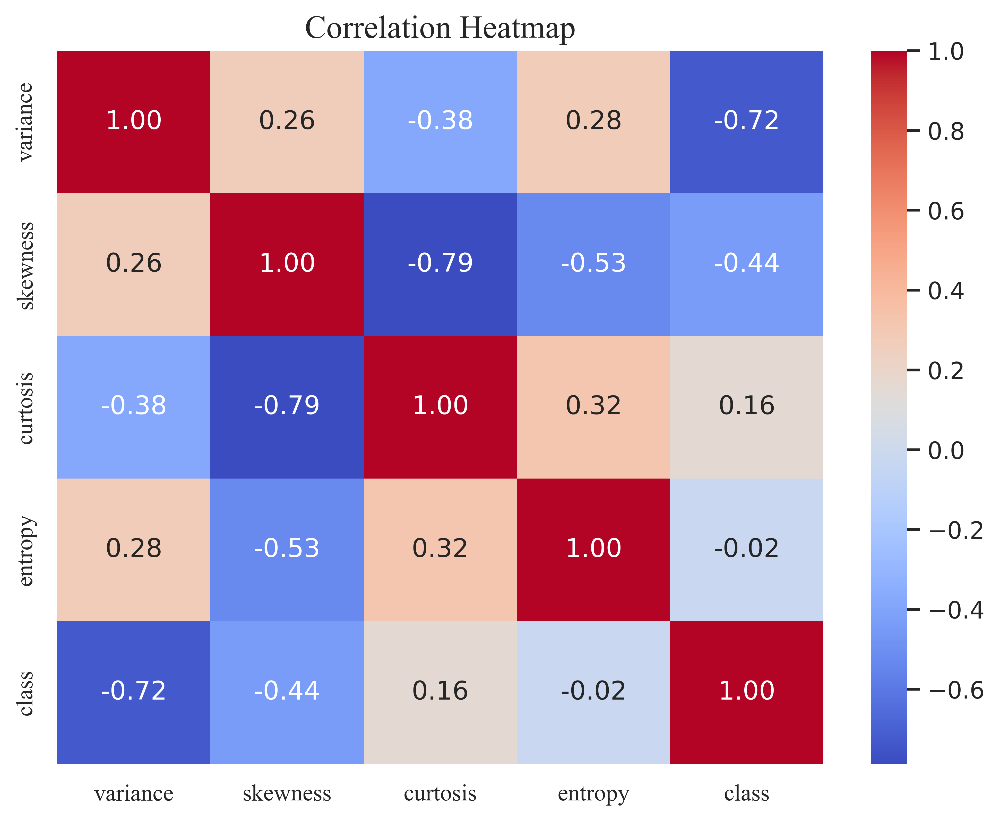

In [ ]:
# Correlation Heatmaps
correlation_data = dataset.corr()

plt.figure(figsize=(8, 6))

heatmap_axis = sns.heatmap(
    correlation_data,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)

heatmap_axis.set_title("Correlation Heatmap", **title_style)

format_axis_ticks(heatmap_axis)

plt.savefig(
    "correlation_heatmap.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

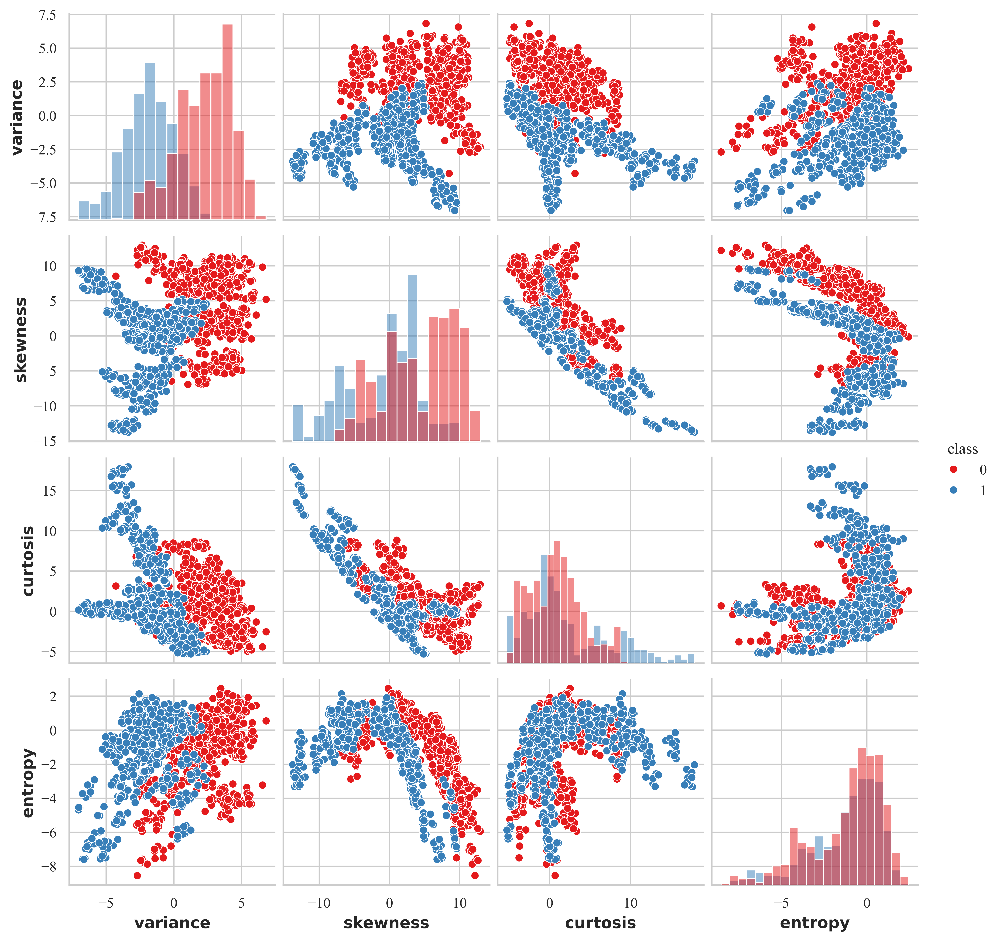

In [ ]:
pairplot_grid = sns.pairplot(
    dataset,
    vars=[
        'variance',
        'skewness',
        'curtosis',
        'entropy'
    ],
    hue='class',
    diag_kind='hist',
    palette='Set1'
)

for axis_row in pairplot_grid.axes:
    for current_axis in axis_row:
        if current_axis is not None:
            format_axis_ticks(current_axis)

format_legend_text(pairplot_grid._legend)

pairplot_grid.savefig(
    "scatter_plot.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

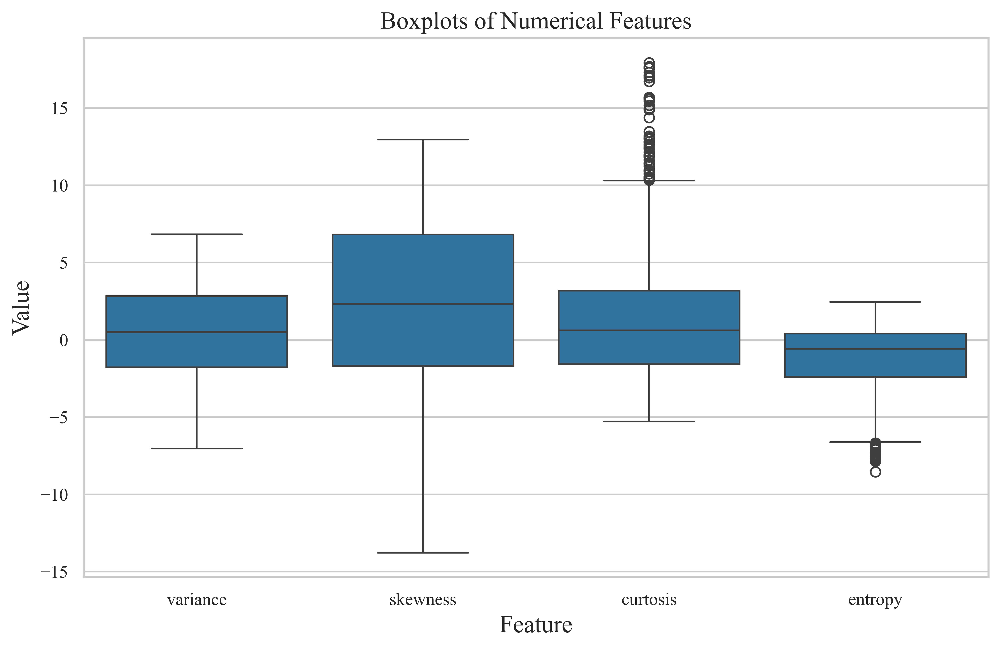

In [ ]:
# Boxplots
feature_melted = dataset[feature_columns].melt(
    var_name='feature',
    value_name='value'
)

plt.figure(figsize=(10, 6))

boxplot_axis = sns.boxplot(
    data=feature_melted,
    x='feature',
    y='value'
)

boxplot_axis.set_title("Boxplots of Numerical Features", **title_style)
boxplot_axis.set_xlabel("Feature", **label_style)
boxplot_axis.set_ylabel("Value", **label_style)

format_axis_ticks(boxplot_axis)

plt.savefig(
    "boxplots.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

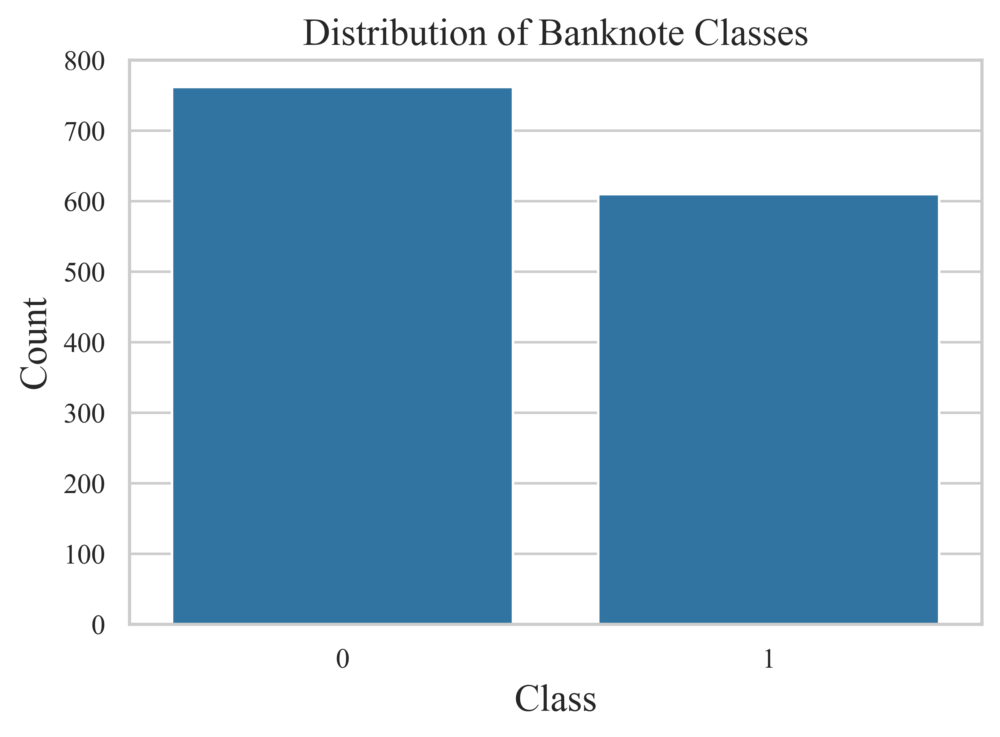

In [ ]:
# Class Distribution Plot
plt.figure(figsize=(6, 4))

countplot_axis = sns.countplot(
    x='class',
    data=dataset
)

countplot_axis.set_title("Distribution of Banknote Classes", **title_style)
countplot_axis.set_xlabel("Class", **label_style)
countplot_axis.set_ylabel("Count", **label_style)

format_axis_ticks(countplot_axis)

plt.savefig(
    "class_distribution.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

In [ ]:
# Task 3: Data Preprocessing
input_data = dataset[feature_columns]
target_data = dataset[target_column]

In [ ]:
from sklearn.preprocessing import StandardScaler
data_scaler = StandardScaler()
normalized_inputs = data_scaler.fit_transform(
    input_data
)

In [ ]:
from sklearn.model_selection import train_test_split
training_inputs, testing_inputs, training_targets, testing_targets = train_test_split(
    normalized_inputs,
    target_data,
    test_size=0.20,
    random_state=42,
    stratify=target_data
)

In [ ]:
print("\nTraining Samples :", len(training_inputs))
print("Testing Samples  :", len(testing_inputs))


Training Samples : 1097
Testing Samples  : 275


In [ ]:
print("\nTraining Feature Shape :", training_inputs.shape)
print("Testing Feature Shape  :", testing_inputs.shape)

print("\nTraining Label Shape :", training_targets.shape)
print("Testing Label Shape  :", testing_targets.shape)


Training Feature Shape : (1097, 4)
Testing Feature Shape  : (275, 4)

Training Label Shape : (1097,)
Testing Label Shape  : (275,)


In [ ]:
# Task 4 : Perceptron
class SingleLayerPerceptron:

    def __init__(
        self,
        number_of_features,
        learning_rate=0.01,
        total_epochs=50
    ):

        self.learning_rate = learning_rate
        self.total_epochs = total_epochs

        # Weight and bias initialization
        self.w = np.zeros(number_of_features)
        self.b = 0.0

        # Store training history
        self.epoch_errors = []
        self.weight_history = []
        self.bias_history = []

    def activate_neuron(self, value):

        if value >= 0:
            return 1

        return 0

    def compute_prediction(self, sample):

        weighted_sum = np.dot(sample, self.w) + self.b

        predicted_class = self.activate_neuron(
            weighted_sum
        )

        return predicted_class

    def train_model(
        self,
        feature_matrix,
        target_vector
    ):

        for epoch in range(self.total_epochs):

            incorrect_predictions = 0

            for sample, actual_class in zip(
                feature_matrix,
                target_vector
            ):

                predicted_class = self.compute_prediction(
                    sample
                )

                prediction_error = (
                    actual_class -
                    predicted_class
                )

                if prediction_error != 0:

                    self.w += (
                        self.learning_rate
                        * prediction_error
                        * sample
                    )

                    self.b += (
                        self.learning_rate
                        * prediction_error
                    )

                    incorrect_predictions += 1

            # Store training history
            self.epoch_errors.append(
                incorrect_predictions
            )

            self.weight_history.append(
                self.w.copy()
            )

            self.bias_history.append(
                self.b
            )

            # Display epoch summary
            print(
                f"Epoch {epoch + 1:2d} | "
                f"Errors: {incorrect_predictions:3d} | "
                f"Bias: {self.b:.4f} | "
                f"Weights: {np.round(self.w,4)}"
            )

            # Stop if converged
            if incorrect_predictions == 0:

                print(
                    f"\nTraining converged after "
                    f"{epoch + 1} epochs."
                )

                break

    def classify_samples(
        self,
        feature_matrix
    ):

        predicted_values = []

        for sample in feature_matrix:

            predicted_values.append(
                self.compute_prediction(
                    sample
                )
            )

        return np.array(
            predicted_values
        )

In [ ]:
learning_parameter = 0.01
epoch_limit = 50

perceptron_model = SingleLayerPerceptron(
    number_of_features=training_inputs.shape[1],
    learning_rate=learning_parameter,
    total_epochs=epoch_limit
)

perceptron_model.train_model(
    training_inputs,
    training_targets
)

Epoch  1 | Errors:  59 | Bias: -0.0300 | Weights: [-0.068  -0.0938 -0.0678 -0.011 ]
Epoch  2 | Errors:  25 | Bias: -0.0400 | Weights: [-0.0775 -0.1042 -0.0811  0.0035]
Epoch  3 | Errors:  20 | Bias: -0.0400 | Weights: [-0.0802 -0.1127 -0.0917 -0.0036]
Epoch  4 | Errors:  19 | Bias: -0.0500 | Weights: [-0.0883 -0.1196 -0.1001  0.0089]
Epoch  5 | Errors:  20 | Bias: -0.0500 | Weights: [-0.0991 -0.1295 -0.1037  0.0102]
Epoch  6 | Errors:  17 | Bias: -0.0600 | Weights: [-0.1027 -0.1277 -0.1134 -0.001 ]
Epoch  7 | Errors:  24 | Bias: -0.0600 | Weights: [-0.1081 -0.1393 -0.1108 -0.0094]
Epoch  8 | Errors:  22 | Bias: -0.0600 | Weights: [-0.117  -0.1357 -0.1319 -0.0025]
Epoch  9 | Errors:  20 | Bias: -0.0600 | Weights: [-0.1176 -0.147  -0.1364 -0.0062]
Epoch 10 | Errors:  20 | Bias: -0.0600 | Weights: [-0.1307 -0.1541 -0.125  -0.006 ]
Epoch 11 | Errors:  22 | Bias: -0.0600 | Weights: [-0.1345 -0.1641 -0.1329 -0.0018]
Epoch 12 | Errors:  20 | Bias: -0.0800 | Weights: [-0.1287 -0.16   -0.1472  

In [ ]:
# Task 6 - Model Evaluation
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

predicted_labels = perceptron_model.classify_samples(
    testing_inputs
)

model_accuracy = accuracy_score(
    testing_targets,
    predicted_labels
)

model_precision = precision_score(
    testing_targets,
    predicted_labels
)

model_recall = recall_score(
    testing_targets,
    predicted_labels
)

model_f1 = f1_score(
    testing_targets,
    predicted_labels
)

confusion_results = confusion_matrix(
    testing_targets,
    predicted_labels
)

print("\nModel Performance")
print(f"Accuracy  : {model_accuracy:.4f}")
print(f"Precision : {model_precision:.4f}")
print(f"Recall    : {model_recall:.4f}")
print(f"F1 Score  : {model_f1:.4f}")

print("\nConfusion Matrix")
print(confusion_results)


Model Performance
Accuracy  : 0.9855
Precision : 0.9683
Recall    : 1.0000
F1 Score  : 0.9839

Confusion Matrix
[[149   4]
 [  0 122]]


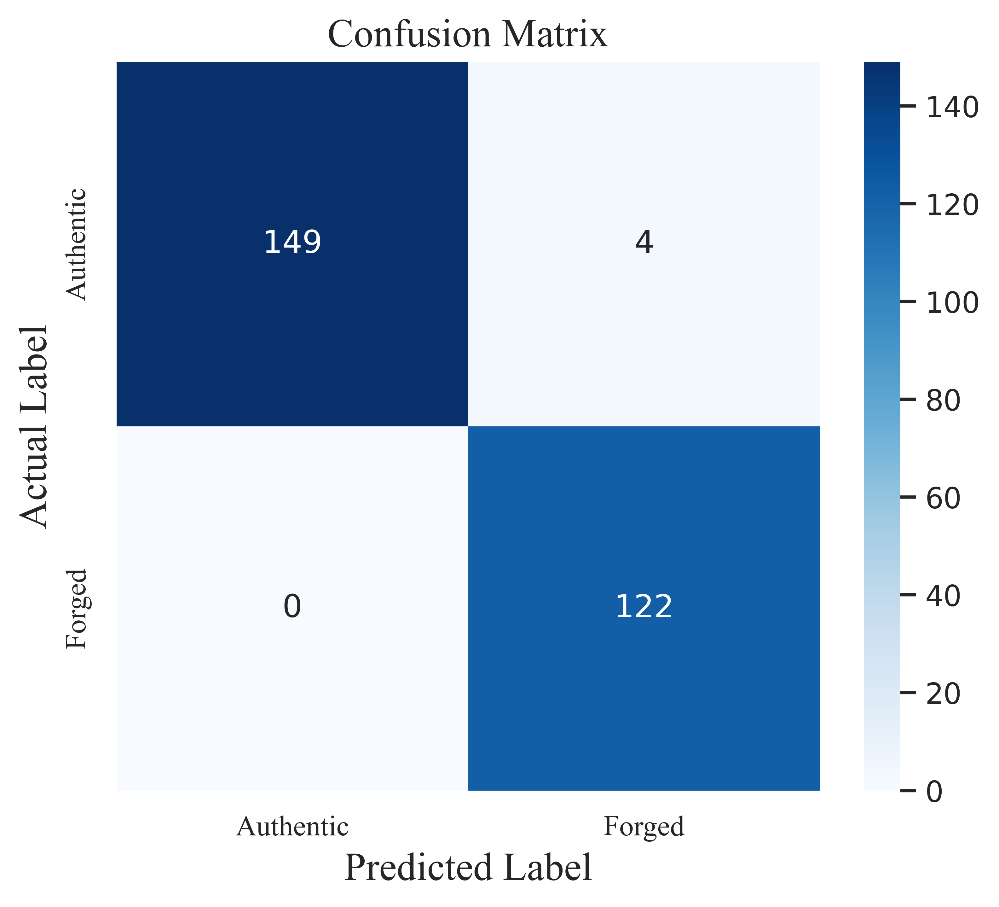

In [ ]:
# Confusion Matrix plot
plt.figure(figsize=(6, 5))

confusion_axis = sns.heatmap(
    confusion_results,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['Authentic', 'Forged'],
    yticklabels=['Authentic', 'Forged']
)

confusion_axis.set_xlabel("Predicted Label", **label_style)
confusion_axis.set_ylabel("Actual Label", **label_style)
confusion_axis.set_title("Confusion Matrix", **title_style)

format_axis_ticks(confusion_axis)

plt.savefig(
    "confusion_matrix.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

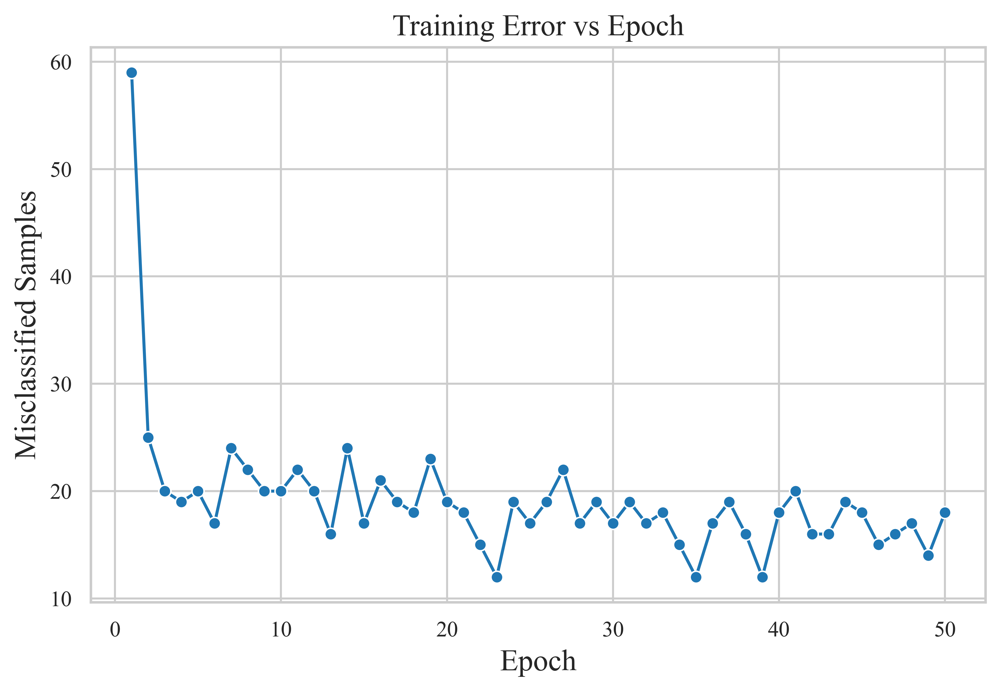

In [ ]:
# Training error vs Epoch
plt.figure(figsize=(8, 5))

error_axis = sns.lineplot(
    x=range(1, len(perceptron_model.epoch_errors) + 1),
    y=perceptron_model.epoch_errors,
    marker='o'
)

error_axis.set_xlabel("Epoch", **label_style)
error_axis.set_ylabel("Misclassified Samples", **label_style)
error_axis.set_title("Training Error vs Epoch", **title_style)

format_axis_ticks(error_axis)

plt.grid(True)

plt.savefig(
    "training_error_vs_epoch.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

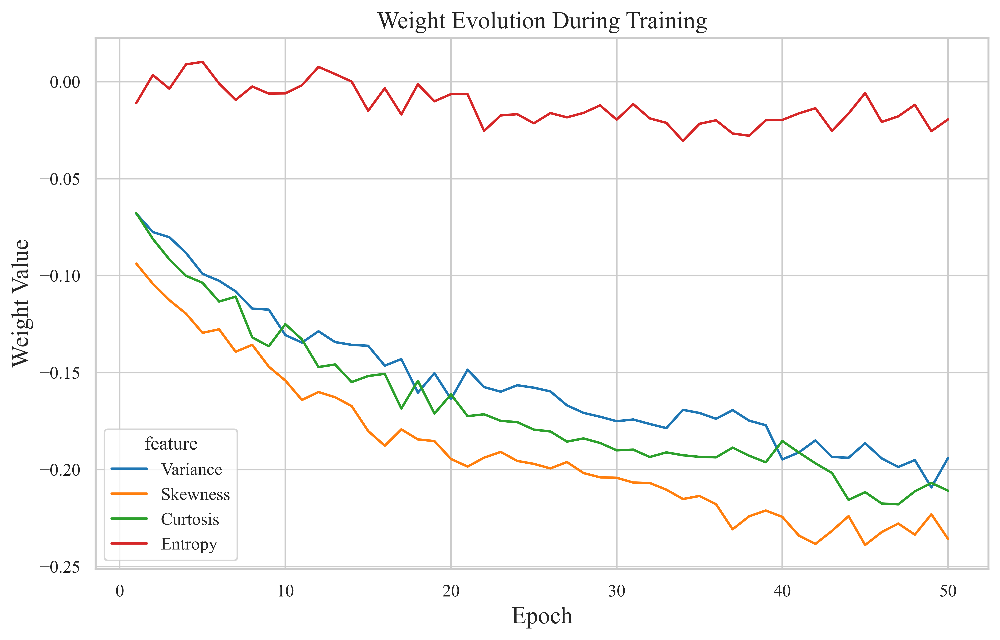

In [ ]:
# Weight evolution plot
weights_array = np.array(
    perceptron_model.weight_history
)

feature_names = [
    'Variance',
    'Skewness',
    'Curtosis',
    'Entropy'
]

weight_history_frame = pd.DataFrame(
    weights_array,
    columns=feature_names
)

weight_history_frame['epoch'] = range(
    1,
    len(weight_history_frame) + 1
)

weight_history_melted = weight_history_frame.melt(
    id_vars='epoch',
    var_name='feature',
    value_name='weight_value'
)

plt.figure(figsize=(10, 6))

weight_axis = sns.lineplot(
    data=weight_history_melted,
    x='epoch',
    y='weight_value',
    hue='feature'
)

weight_axis.set_xlabel("Epoch", **label_style)
weight_axis.set_ylabel("Weight Value", **label_style)
weight_axis.set_title("Weight Evolution During Training", **title_style)

format_axis_ticks(weight_axis)
format_legend_text(weight_axis.get_legend())

plt.grid(True)

plt.savefig(
    "weight_evolution.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

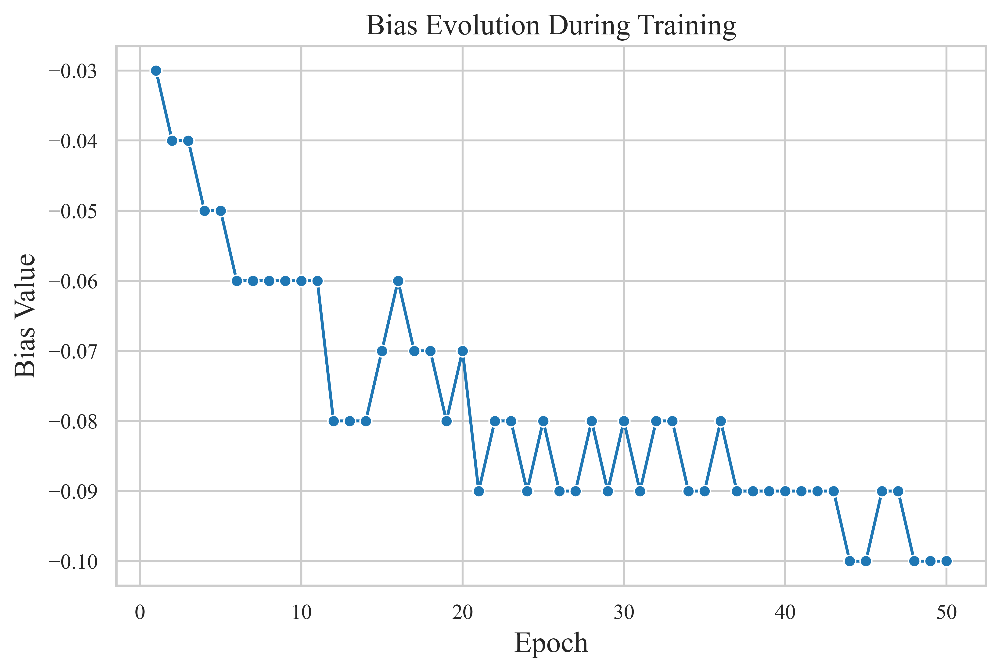

In [ ]:
# Bias Evolution Plot
plt.figure(figsize=(8, 5))

bias_axis = sns.lineplot(
    x=range(1, len(perceptron_model.bias_history) + 1),
    y=perceptron_model.bias_history,
    marker='o'
)

bias_axis.set_xlabel("Epoch", **label_style)
bias_axis.set_ylabel("Bias Value", **label_style)
bias_axis.set_title("Bias Evolution During Training", **title_style)

format_axis_ticks(bias_axis)

plt.grid(True)

plt.savefig(
    "bias_evolution.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()


In [ ]:
# Task 7: Learning Rate Comparison
learning_rates = [0.001, 0.01, 0.1]

learning_rate_results = {}
learning_rate_errors = {}

for current_lr in learning_rates:

    current_model = SingleLayerPerceptron(
        number_of_features=training_inputs.shape[1],
        learning_rate=current_lr,
        total_epochs=50
    )

    current_model.train_model(
        training_inputs,
        training_targets
    )

    current_predictions = current_model.classify_samples(
        testing_inputs
    )

    learning_rate_results[current_lr] = {
        "Accuracy": accuracy_score(
            testing_targets,
            current_predictions
        ),
        "Epochs": len(
            current_model.epoch_errors
        )
    }

    learning_rate_errors[current_lr] = (
        current_model.epoch_errors
    )


Epoch  1 | Errors:  59 | Bias: -0.0030 | Weights: [-0.0068 -0.0094 -0.0068 -0.0011]
Epoch  2 | Errors:  25 | Bias: -0.0040 | Weights: [-0.0078 -0.0104 -0.0081  0.0003]
Epoch  3 | Errors:  20 | Bias: -0.0040 | Weights: [-0.008  -0.0113 -0.0092 -0.0004]
Epoch  4 | Errors:  19 | Bias: -0.0050 | Weights: [-0.0088 -0.012  -0.01    0.0009]
Epoch  5 | Errors:  20 | Bias: -0.0050 | Weights: [-0.0099 -0.013  -0.0104  0.001 ]
Epoch  6 | Errors:  17 | Bias: -0.0060 | Weights: [-0.0103 -0.0128 -0.0113 -0.0001]
Epoch  7 | Errors:  24 | Bias: -0.0060 | Weights: [-0.0108 -0.0139 -0.0111 -0.0009]
Epoch  8 | Errors:  22 | Bias: -0.0060 | Weights: [-0.0117 -0.0136 -0.0132 -0.0002]
Epoch  9 | Errors:  20 | Bias: -0.0060 | Weights: [-0.0118 -0.0147 -0.0136 -0.0006]
Epoch 10 | Errors:  20 | Bias: -0.0060 | Weights: [-0.0131 -0.0154 -0.0125 -0.0006]
Epoch 11 | Errors:  22 | Bias: -0.0060 | Weights: [-0.0135 -0.0164 -0.0133 -0.0002]
Epoch 12 | Errors:  20 | Bias: -0.0080 | Weights: [-0.0129 -0.016  -0.0147  

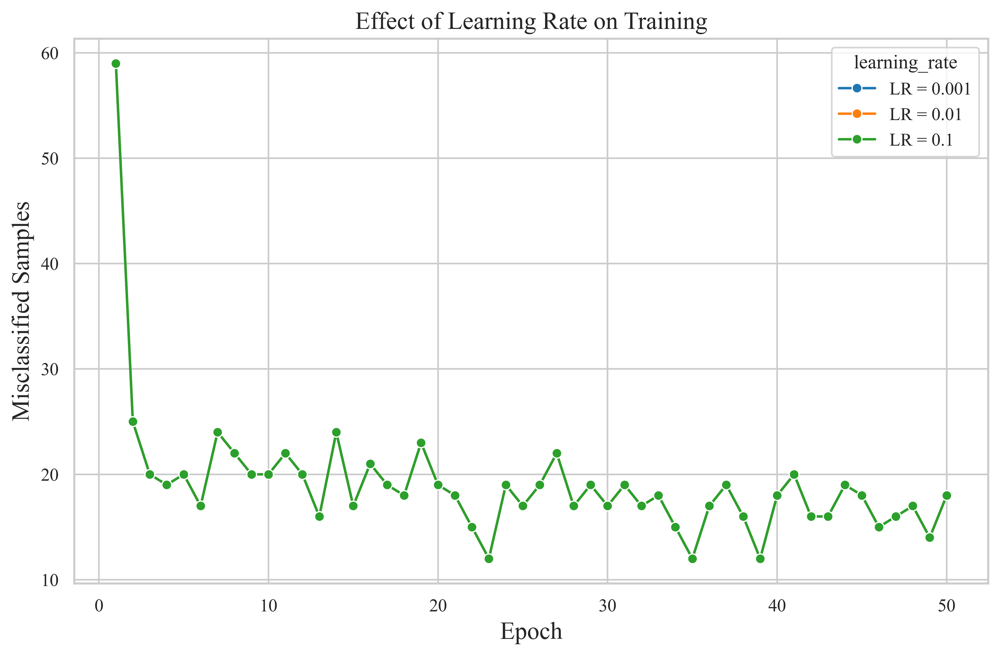


Learning Rate Comparison
---------------------------------------------
Learning Rate: 0.001  | Accuracy: 0.9855 | Epochs: 50
Learning Rate: 0.01   | Accuracy: 0.9855 | Epochs: 50
Learning Rate: 0.1    | Accuracy: 0.9855 | Epochs: 50


In [ ]:
# Plot Learning Rate Comparison
learning_rate_records = []

for current_lr in learning_rates:

    for current_epoch, current_error_count in enumerate(
        learning_rate_errors[current_lr],
        start=1
    ):

        learning_rate_records.append({
            'epoch': current_epoch,
            'errors': current_error_count,
            'learning_rate': f"LR = {current_lr}"
        })

learning_rate_frame = pd.DataFrame(
    learning_rate_records
)

plt.figure(figsize=(10, 6))

learning_rate_axis = sns.lineplot(
    data=learning_rate_frame,
    x='epoch',
    y='errors',
    hue='learning_rate',
    marker='o'
)

learning_rate_axis.set_xlabel("Epoch", **label_style)
learning_rate_axis.set_ylabel("Misclassified Samples", **label_style)
learning_rate_axis.set_title("Effect of Learning Rate on Training", **title_style)

format_axis_ticks(learning_rate_axis)
format_legend_text(learning_rate_axis.get_legend())

plt.grid(True)

plt.savefig(
    "learning_rate_comparison.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

print("\nLearning Rate Comparison")
print("-" * 45)

for lr, values in learning_rate_results.items():

    print(
        f"Learning Rate: {lr:<6} | "
        f"Accuracy: {values['Accuracy']:.4f} | "
        f"Epochs: {values['Epochs']}"
    )

In [ ]:
# Task 8 : Comparison with scikit-learn perceptron
from sklearn.linear_model import Perceptron

sklearn_model = Perceptron(
    random_state=42,
    max_iter=1000
)

sklearn_model.fit(
    training_inputs,
    training_targets
)

sklearn_predictions = sklearn_model.predict(
    testing_inputs
)

sklearn_accuracy = accuracy_score(
    testing_targets,
    sklearn_predictions
)

sklearn_precision = precision_score(
    testing_targets,
    sklearn_predictions
)

sklearn_recall = recall_score(
    testing_targets,
    sklearn_predictions
)

sklearn_f1 = f1_score(
    testing_targets,
    sklearn_predictions
)

print("\nScikit-Learn Perceptron Results")
print("-"*40)

print(f"Accuracy  : {sklearn_accuracy:.4f}")
print(f"Precision : {sklearn_precision:.4f}")
print(f"Recall    : {sklearn_recall:.4f}")
print(f"F1 Score  : {sklearn_f1:.4f}")


Scikit-Learn Perceptron Results
----------------------------------------
Accuracy  : 0.9782
Precision : 0.9677
Recall    : 0.9836
F1 Score  : 0.9756


In [ ]:
# Scratch vs Scikit-Learn Comparison Table
comparison_frame = pd.DataFrame({
    "Model": ["Scratch Perceptron", "Scikit-Learn Perceptron"],
    "Accuracy": [model_accuracy, sklearn_accuracy],
    "Precision": [model_precision, sklearn_precision],
    "Recall": [model_recall, sklearn_recall],
    "F1 Score": [model_f1, sklearn_f1]
})

print("\nScratch vs Scikit-Learn Comparison")
print(comparison_frame)


Scratch vs Scikit-Learn Comparison
                     Model  Accuracy  Precision    Recall  F1 Score
0       Scratch Perceptron  0.985455   0.968254  1.000000  0.983871
1  Scikit-Learn Perceptron  0.978182   0.967742  0.983607  0.975610


Epoch  1 | Errors: 196 | Bias: 0.0000 | Weights: [-0.017  -0.0192]
Epoch  2 | Errors: 189 | Bias: 0.0100 | Weights: [-0.0216 -0.0223]
Epoch  3 | Errors: 193 | Bias: 0.0000 | Weights: [-0.0223 -0.0214]
Epoch  4 | Errors: 192 | Bias: 0.0000 | Weights: [-0.0101 -0.0154]
Epoch  5 | Errors: 188 | Bias: 0.0000 | Weights: [-0.0108 -0.0174]
Epoch  6 | Errors: 200 | Bias: 0.0000 | Weights: [-0.0302 -0.0295]
Epoch  7 | Errors: 190 | Bias: 0.0000 | Weights: [-0.0226 -0.026 ]
Epoch  8 | Errors: 192 | Bias: 0.0000 | Weights: [-0.012  -0.0182]
Epoch  9 | Errors: 198 | Bias: 0.0000 | Weights: [-0.0183 -0.0303]
Epoch 10 | Errors: 182 | Bias: 0.0000 | Weights: [-0.0202 -0.0192]
Epoch 11 | Errors: 206 | Bias: 0.0000 | Weights: [-0.0195 -0.0186]
Epoch 12 | Errors: 192 | Bias: 0.0000 | Weights: [-0.0125 -0.0167]
Epoch 13 | Errors: 198 | Bias: 0.0000 | Weights: [-0.0106 -0.0161]
Epoch 14 | Errors: 196 | Bias: 0.0000 | Weights: [-0.0106 -0.0174]
Epoch 15 | Errors: 200 | Bias: 0.0000 | Weights: [-0.0301 -0.0

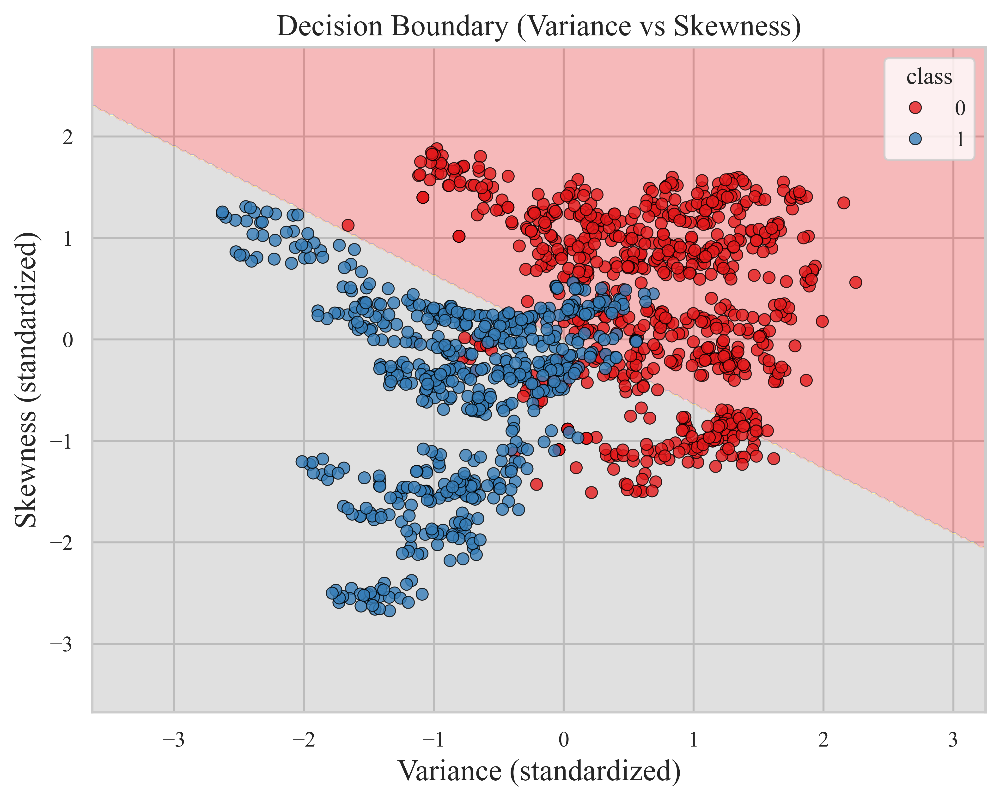

In [ ]:
# Optional Task : Decision Boundary Visualization
boundary_features = ['variance', 'skewness']

boundary_inputs = data_scaler.fit_transform(
    dataset[boundary_features]
)

boundary_training_inputs, boundary_testing_inputs, boundary_training_targets, boundary_testing_targets = train_test_split(
    boundary_inputs,
    target_data,
    test_size=0.20,
    random_state=42,
    stratify=target_data
)

boundary_model = SingleLayerPerceptron(
    number_of_features=boundary_training_inputs.shape[1],
    learning_rate=0.01,
    total_epochs=50
)

boundary_model.train_model(
    boundary_training_inputs,
    boundary_training_targets
)

axis_one_values = np.linspace(
    boundary_inputs[:, 0].min() - 1,
    boundary_inputs[:, 0].max() + 1,
    300
)

axis_two_values = np.linspace(
    boundary_inputs[:, 1].min() - 1,
    boundary_inputs[:, 1].max() + 1,
    300
)

mesh_axis_one, mesh_axis_two = np.meshgrid(
    axis_one_values,
    axis_two_values
)

mesh_points = np.c_[
    mesh_axis_one.ravel(),
    mesh_axis_two.ravel()
]

mesh_predictions = boundary_model.classify_samples(
    mesh_points
).reshape(mesh_axis_one.shape)

plt.figure(figsize=(8, 6))

plt.contourf(
    mesh_axis_one,
    mesh_axis_two,
    mesh_predictions,
    alpha=0.3,
    cmap='Set1'
)

boundary_axis = sns.scatterplot(
    x=boundary_inputs[:, 0],
    y=boundary_inputs[:, 1],
    hue=target_data,
    palette='Set1',
    edgecolor='black',
    alpha=0.8
)

boundary_axis.set_xlabel("Variance (standardized)", **label_style)
boundary_axis.set_ylabel("Skewness (standardized)", **label_style)
boundary_axis.set_title("Decision Boundary (Variance vs Skewness)", **title_style)

format_axis_ticks(boundary_axis)
format_legend_text(boundary_axis.get_legend())

plt.savefig(
    "decision_boundary.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

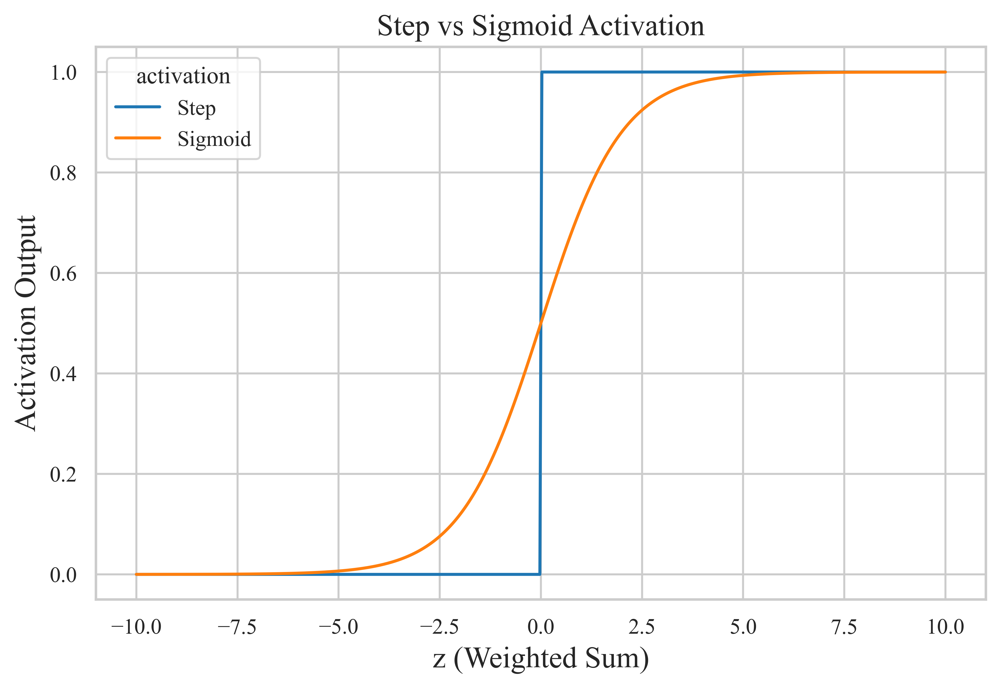

In [ ]:
# Additional Task : Step vs Sigmoid Activation Comparison
z_values = np.linspace(-10, 10, 400)

step_outputs = np.where(z_values >= 0, 1, 0)
sigmoid_outputs = 1 / (1 + np.exp(-z_values))

activation_frame = pd.DataFrame({
    'z': np.concatenate([z_values, z_values]),
    'output': np.concatenate([step_outputs, sigmoid_outputs]),
    'activation': (
        ['Step'] * len(z_values)
        + ['Sigmoid'] * len(z_values)
    )
})

plt.figure(figsize=(8, 5))

activation_axis = sns.lineplot(
    data=activation_frame,
    x='z',
    y='output',
    hue='activation'
)

activation_axis.set_xlabel("z (Weighted Sum)", **label_style)
activation_axis.set_ylabel("Activation Output", **label_style)
activation_axis.set_title("Step vs Sigmoid Activation", **title_style)

format_axis_ticks(activation_axis)
format_legend_text(activation_axis.get_legend())

plt.grid(True)

plt.savefig(
    "step_vs_sigmoid_comparison.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

In [ ]:
print(
    "\nThe Step function is flat everywhere except at z = 0, where it is "
    "undefined, so it carries no usable gradient for backpropagation. "
    "The Sigmoid function is smooth and differentiable across its entire "
    "range, which is why modern deep networks use it (or similar "
    "differentiable activations) instead of the Step function."
)



The Step function is flat everywhere except at z = 0, where it is undefined, so it carries no usable gradient for backpropagation. The Sigmoid function is smooth and differentiable across its entire range, which is why modern deep networks use it (or similar differentiable activations) instead of the Step function.


Epoch  1 | Errors:   3 | Bias: -0.1000 | Weights: [-0.1  0. ]
Epoch  2 | Errors:   3 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  3 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  4 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  5 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  6 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  7 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  8 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch  9 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 10 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 11 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 12 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 13 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 14 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 15 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 16 | Errors:   4 | Bias: 0.0000 | Weights: [-0.1  0. ]
Epoch 17 | Errors:   4 

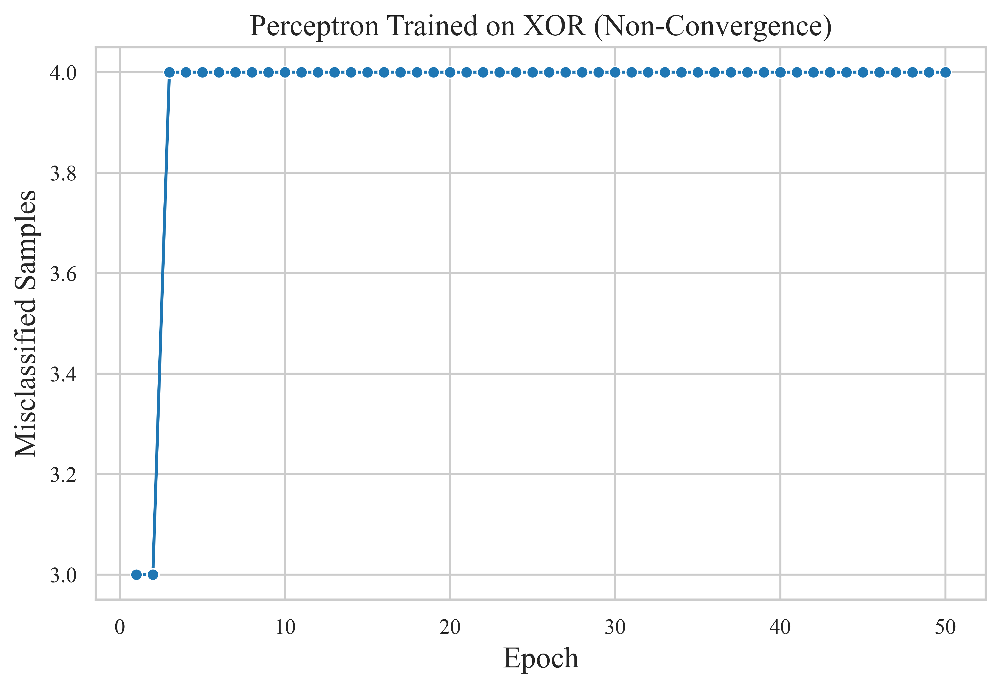

In [ ]:
# Additional Task : XOR Limitation Demonstration
xor_inputs = np.array([
    [0, 0],
    [0, 1],
    [1, 0],
    [1, 1]
])

xor_targets = np.array([0, 1, 1, 0])

xor_model = SingleLayerPerceptron(
    number_of_features=xor_inputs.shape[1],
    learning_rate=0.1,
    total_epochs=50
)

xor_model.train_model(
    xor_inputs,
    xor_targets
)

xor_predictions = xor_model.classify_samples(
    xor_inputs
)

print("\nXOR Predictions :", xor_predictions)
print("XOR Targets     :", xor_targets)

plt.figure(figsize=(8, 5))

xor_axis = sns.lineplot(
    x=range(1, len(xor_model.epoch_errors) + 1),
    y=xor_model.epoch_errors,
    marker='o'
)

xor_axis.set_xlabel("Epoch", **label_style)
xor_axis.set_ylabel("Misclassified Samples", **label_style)
xor_axis.set_title("Perceptron Trained on XOR (Non-Convergence)", **title_style)

format_axis_ticks(xor_axis)

plt.grid(True)

plt.savefig(
    "xor_limitation_demo.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()

In [ ]:
print(
    "\nThe perceptron never drives the error to zero on XOR because XOR "
    "is not linearly separable -- no single straight line can separate "
    "class 0 from class 1. This confirms that a Single Layer Perceptron "
    "can only learn linear decision boundaries and requires at least one "
    "hidden layer (a Multilayer Perceptron) to solve XOR."
)


The perceptron never drives the error to zero on XOR because XOR is not linearly separable -- no single straight line can separate class 0 from class 1. This confirms that a Single Layer Perceptron can only learn linear decision boundaries and requires at least one hidden layer (a Multilayer Perceptron) to solve XOR.


Epoch  1 | Errors:  63 | Bias: 0.2100 | Weights: [-0.2735 -0.1785 -0.1938 -0.0284]
Epoch  2 | Errors:  37 | Bias: 0.3000 | Weights: [-0.4042 -0.2721 -0.2643 -0.1107]
Epoch  3 | Errors:  31 | Bias: 0.3700 | Weights: [-0.411  -0.3424 -0.3324 -0.0695]
Epoch  4 | Errors:  22 | Bias: 0.3900 | Weights: [-0.4604 -0.3409 -0.3613 -0.0246]
Epoch  5 | Errors:  19 | Bias: 0.4400 | Weights: [-0.4809 -0.3588 -0.3689 -0.0497]
Epoch  6 | Errors:  21 | Bias: 0.4700 | Weights: [-0.517  -0.345  -0.3604 -0.0473]
Epoch  7 | Errors:  22 | Bias: 0.5100 | Weights: [-0.5289 -0.3997 -0.3376 -0.1246]
Epoch  8 | Errors:  18 | Bias: 0.5300 | Weights: [-0.5524 -0.3522 -0.4018 -0.1243]
Epoch  9 | Errors:  17 | Bias: 0.5600 | Weights: [-0.5486 -0.4016 -0.3531 -0.0707]
Epoch 10 | Errors:  21 | Bias: 0.5700 | Weights: [-0.5835 -0.4229 -0.378  -0.0513]
Epoch 11 | Errors:  16 | Bias: 0.6100 | Weights: [-0.5939 -0.3955 -0.3503 -0.0528]
Epoch 12 | Errors:  25 | Bias: 0.6400 | Weights: [-0.6646 -0.3693 -0.3929 -0.0979]
Epoc

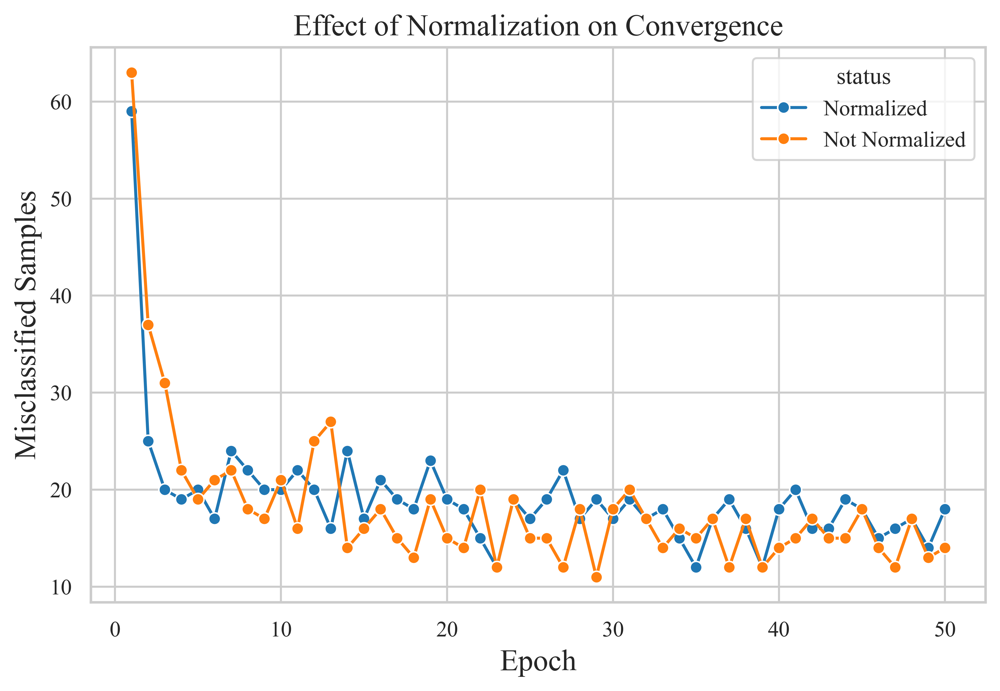

In [ ]:
# Additional Task : Effect of Feature Normalization on Convergence
raw_inputs = dataset[feature_columns].values

raw_training_inputs, raw_testing_inputs, raw_training_targets, raw_testing_targets = train_test_split(
    raw_inputs,
    target_data,
    test_size=0.20,
    random_state=42,
    stratify=target_data
)

raw_model = SingleLayerPerceptron(
    number_of_features=raw_training_inputs.shape[1],
    learning_rate=0.01,
    total_epochs=50
)

raw_model.train_model(
    raw_training_inputs,
    raw_training_targets
)

normalization_records = []

for current_epoch, current_error_count in enumerate(
    perceptron_model.epoch_errors,
    start=1
):

    normalization_records.append({
        'epoch': current_epoch,
        'errors': current_error_count,
        'status': 'Normalized'
    })

for current_epoch, current_error_count in enumerate(
    raw_model.epoch_errors,
    start=1
):

    normalization_records.append({
        'epoch': current_epoch,
        'errors': current_error_count,
        'status': 'Not Normalized'
    })

normalization_frame = pd.DataFrame(
    normalization_records
)

plt.figure(figsize=(8, 5))

normalization_axis = sns.lineplot(
    data=normalization_frame,
    x='epoch',
    y='errors',
    hue='status',
    marker='o'
)

normalization_axis.set_xlabel("Epoch", **label_style)
normalization_axis.set_ylabel("Misclassified Samples", **label_style)
normalization_axis.set_title("Effect of Normalization on Convergence", **title_style)

format_axis_ticks(normalization_axis)
format_legend_text(normalization_axis.get_legend())

plt.grid(True)

plt.savefig(
    "normalization_effect_comparison.eps",
    format='eps',
    dpi=600,
    bbox_inches='tight'
)

plt.show()


In [ ]:
print(
    "\nWithout normalization, features with larger numeric ranges "
    "dominate the weighted sum and the resulting weight updates, which "
    "makes convergence slower and noisier. Standardizing the features "
    "puts every feature on a comparable scale, giving faster, smoother "
    "convergence, as seen when comparing the two error curves above."
)


Without normalization, features with larger numeric ranges dominate the weighted sum and the resulting weight updates, which makes convergence slower and noisier. Standardizing the features puts every feature on a comparable scale, giving faster, smoother convergence, as seen when comparing the two error curves above.


In [4]:
# CELL 1 of 7 -- Task Extension : Logic Gate Perceptron Class

class GateLevelPerceptron:
    """Single layer perceptron that records (weights, bias) after
    every individual weight update, not just once per epoch."""

    def __init__(self, number_of_features, learning_rate=0.1):
        self.w = np.zeros(number_of_features)
        self.b = 0.0
        self.learning_rate = learning_rate
        self.update_history = [(self.w.copy(), self.b)]

    def activate_neuron(self, value):
        return 1 if value >= 0 else 0

    def compute_prediction(self, sample):
        weighted_sum = np.dot(sample, self.w) + self.b
        return self.activate_neuron(weighted_sum)

    def train_model(self, feature_matrix, target_vector, total_epochs=10):
        update_number = 0

        for epoch in range(1, total_epochs + 1):
            incorrect_predictions = 0

            for sample, actual_class in zip(feature_matrix, target_vector):
                predicted_class = self.compute_prediction(sample)
                prediction_error = actual_class - predicted_class

                if prediction_error != 0:
                    self.w += self.learning_rate * prediction_error * sample
                    self.b += self.learning_rate * prediction_error
                    update_number += 1
                    incorrect_predictions += 1

                    self.update_history.append((self.w.copy(), self.b))

                    print(
                        f"Update {update_number:2d} (epoch {epoch}) | "
                        f"input={sample} target={actual_class} predicted={predicted_class} | "
                        f"weights={np.round(self.w, 3)} bias={round(self.b, 3)}"
                    )

            if incorrect_predictions == 0:
                print(f"Converged after epoch {epoch} -- no updates needed.\n")
                break

In [5]:
# CELL 2 of 7 -- Decision Boundary Plotting Functions
# ===================================================================

def plot_gate_decision_boundary_2d(feature_matrix, target_vector, update_history, gate_name):
    """Plots the decision boundary after every weight update for a
    2-input gate (AND / OR)."""

    total_updates = len(update_history)
    plot_columns = 4
    plot_rows = int(np.ceil(total_updates / plot_columns))

    gate_figure, gate_axes = plt.subplots(
        plot_rows, plot_columns, figsize=(4 * plot_columns, 3.5 * plot_rows)
    )
    gate_axes = np.array(gate_axes).reshape(-1)

    x_axis_range = np.linspace(-0.5, 1.5, 200)

    point_frame = pd.DataFrame(feature_matrix, columns=['x1', 'x2'])
    point_frame['class'] = target_vector

    for update_index, (weights, bias) in enumerate(update_history):
        current_axis = gate_axes[update_index]

        sns.scatterplot(
            data=point_frame,
            x='x1',
            y='x2',
            hue='class',
            palette={0: 'tab:red', 1: 'tab:blue'},
            s=90,
            edgecolor='black',
            legend=False,
            ax=current_axis,
            zorder=3
        )

        if abs(weights[1]) > 1e-9:
            y_axis_values = -(weights[0] * x_axis_range + bias) / weights[1]
            current_axis.plot(x_axis_range, y_axis_values, 'k-', linewidth=2)
        elif abs(weights[0]) > 1e-9:
            x_boundary_line = -bias / weights[0]
            current_axis.axvline(x_boundary_line, color='k', linewidth=2)

        current_axis.set_xlim(-0.5, 1.5)
        current_axis.set_ylim(-0.5, 1.5)
        current_axis.set_title(
            f"Update {update_index}\nw={np.round(weights,2)}, b={round(bias,2)}",
            fontsize=11, fontweight='bold', fontname='Times New Roman'
        )
        current_axis.set_xlabel("x1", **label_style)
        current_axis.set_ylabel("x2", **label_style)

        format_axis_ticks(current_axis)

    for empty_axis_index in range(total_updates, len(gate_axes)):
        gate_axes[empty_axis_index].axis('off')

    gate_figure.suptitle(
        f"{gate_name} Gate -- Decision Boundary After Each Update",
        fontsize=15, fontweight='bold', fontname='Times New Roman'
    )

    plt.tight_layout()

    plt.savefig(
        f"{gate_name.lower()}_decision_boundary.eps",
        format='eps', dpi=600, bbox_inches='tight'
    )

    plt.show()


def plot_gate_decision_boundary_1d(feature_matrix, target_vector, update_history, gate_name):
    """Plots the decision boundary after every weight update for a
    1-input gate (NOT)."""

    total_updates = len(update_history)
    plot_columns = 4
    plot_rows = int(np.ceil(total_updates / plot_columns))

    gate_figure, gate_axes = plt.subplots(
        plot_rows, plot_columns, figsize=(4 * plot_columns, 3 * plot_rows)
    )
    gate_axes = np.array(gate_axes).reshape(-1)

    point_frame = pd.DataFrame(feature_matrix, columns=['x1'])
    point_frame['x2'] = 0
    point_frame['class'] = target_vector

    for update_index, (weights, bias) in enumerate(update_history):
        current_axis = gate_axes[update_index]

        sns.scatterplot(
            data=point_frame,
            x='x1',
            y='x2',
            hue='class',
            palette={0: 'tab:red', 1: 'tab:blue'},
            s=140,
            edgecolor='black',
            legend=False,
            ax=current_axis,
            zorder=3
        )

        if abs(weights[0]) > 1e-9:
            x_boundary_line = -bias / weights[0]
            current_axis.axvline(x_boundary_line, color='k', linewidth=2)

        current_axis.set_xlim(-0.5, 1.5)
        current_axis.set_ylim(-1, 1)
        current_axis.set_yticks([])
        current_axis.set_title(
            f"Update {update_index}\nw={np.round(weights,2)}, b={round(bias,2)}",
            fontsize=11, fontweight='bold', fontname='Times New Roman'
        )
        current_axis.set_xlabel("x1", **label_style)

        format_axis_ticks(current_axis)

    for empty_axis_index in range(total_updates, len(gate_axes)):
        gate_axes[empty_axis_index].axis('off')

    gate_figure.suptitle(
        f"{gate_name} Gate -- Decision Boundary After Each Update",
        fontsize=15, fontweight='bold', fontname='Times New Roman'
    )

    plt.tight_layout()

    plt.savefig(
        f"{gate_name.lower()}_decision_boundary.eps",
        format='eps', dpi=600, bbox_inches='tight'
    )

    plt.show()

In [6]:
# CELL 3 of 7 -- AND Gate
# ===================================================================

print("=" * 60)
print("AND GATE")
print("=" * 60)

and_gate_inputs = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
and_gate_targets = np.array([0, 0, 0, 1])

and_gate_perceptron = GateLevelPerceptron(number_of_features=2, learning_rate=0.1)
and_gate_perceptron.train_model(and_gate_inputs, and_gate_targets, total_epochs=10)

plot_gate_decision_boundary_2d(
    and_gate_inputs, and_gate_targets, and_gate_perceptron.update_history, "AND"
)

AND GATE
Update  1 (epoch 1) | input=[0 0] target=0 predicted=1 | weights=[0. 0.] bias=-0.1
Update  2 (epoch 1) | input=[1 1] target=1 predicted=0 | weights=[0.1 0.1] bias=0.0
Update  3 (epoch 2) | input=[0 0] target=0 predicted=1 | weights=[0.1 0.1] bias=-0.1
Update  4 (epoch 2) | input=[0 1] target=0 predicted=1 | weights=[0.1 0. ] bias=-0.2
Update  5 (epoch 2) | input=[1 1] target=1 predicted=0 | weights=[0.2 0.1] bias=-0.1
Update  6 (epoch 3) | input=[0 1] target=0 predicted=1 | weights=[0.2 0. ] bias=-0.2
Update  7 (epoch 3) | input=[1 0] target=0 predicted=1 | weights=[0.1 0. ] bias=-0.3
Update  8 (epoch 3) | input=[1 1] target=1 predicted=0 | weights=[0.2 0.1] bias=-0.2
Converged after epoch 4 -- no updates needed.



OR GATE
Update  1 (epoch 1) | input=[0 0] target=0 predicted=1 | weights=[0. 0.] bias=-0.1
Update  2 (epoch 1) | input=[0 1] target=1 predicted=0 | weights=[0.  0.1] bias=0.0
Update  3 (epoch 2) | input=[0 0] target=0 predicted=1 | weights=[0.  0.1] bias=-0.1
Update  4 (epoch 2) | input=[1 0] target=1 predicted=0 | weights=[0.1 0.1] bias=0.0
Update  5 (epoch 3) | input=[0 0] target=0 predicted=1 | weights=[0.1 0.1] bias=-0.1
Converged after epoch 4 -- no updates needed.



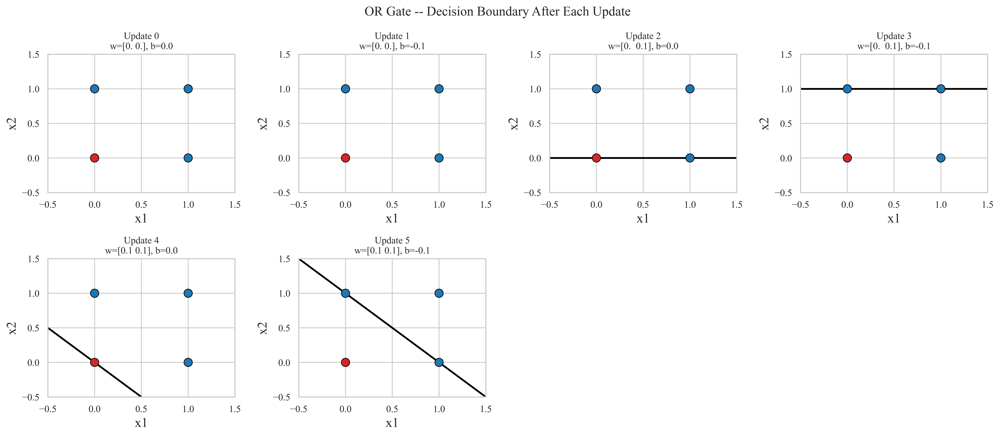

In [7]:
# CELL 4 of 7 -- OR Gate
# ===================================================================

print("=" * 60)
print("OR GATE")
print("=" * 60)

or_gate_inputs = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
or_gate_targets = np.array([0, 1, 1, 1])

or_gate_perceptron = GateLevelPerceptron(number_of_features=2, learning_rate=0.1)
or_gate_perceptron.train_model(or_gate_inputs, or_gate_targets, total_epochs=10)

plot_gate_decision_boundary_2d(
    or_gate_inputs, or_gate_targets, or_gate_perceptron.update_history, "OR"
)

NOT GATE
Update  1 (epoch 1) | input=[1] target=0 predicted=1 | weights=[-0.1] bias=-0.1
Update  2 (epoch 2) | input=[0] target=1 predicted=0 | weights=[-0.1] bias=0.0
Converged after epoch 3 -- no updates needed.



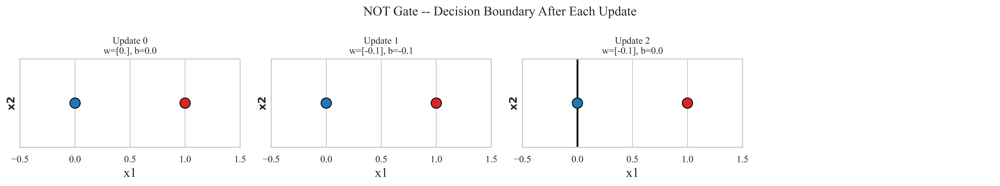

In [8]:
# CELL 5 of 7 -- NOT Gate
# ===================================================================

print("=" * 60)
print("NOT GATE")
print("=" * 60)

not_gate_inputs = np.array([[0], [1]])
not_gate_targets = np.array([1, 0])

not_gate_perceptron = GateLevelPerceptron(number_of_features=1, learning_rate=0.1)
not_gate_perceptron.train_model(not_gate_inputs, not_gate_targets, total_epochs=10)

plot_gate_decision_boundary_1d(
    not_gate_inputs, not_gate_targets, not_gate_perceptron.update_history, "NOT"
)

In [9]:
# CELL 6 of 7 -- Final Weights Summary
# ===================================================================

print("=" * 60)
print("FINAL WEIGHTS SUMMARY")
print("=" * 60)
print(f"AND -> weights={and_gate_perceptron.w}, bias={and_gate_perceptron.b}")
print(f"OR  -> weights={or_gate_perceptron.w}, bias={or_gate_perceptron.b}")
print(f"NOT -> weights={not_gate_perceptron.w}, bias={not_gate_perceptron.b}")

FINAL WEIGHTS SUMMARY
AND -> weights=[0.2 0.1], bias=-0.20000000000000004
OR  -> weights=[0.1 0.1], bias=-0.1
NOT -> weights=[-0.1], bias=0.0


In [10]:
# CELL 7 of 7 -- Download the Gate EPS Plots (Colab only)
# ===================================================================

import glob
import zipfile
from google.colab import files

gate_eps_files = glob.glob("*_decision_boundary.eps")
print(f"Found {len(gate_eps_files)} EPS files:")
for eps_file in gate_eps_files:
    print(" -", eps_file)

with zipfile.ZipFile("logic_gates_eps_plots.zip", "w") as zip_file:
    for eps_file in gate_eps_files:
        zip_file.write(eps_file)

files.download("logic_gates_eps_plots.zip")

Found 3 EPS files:
 - not_decision_boundary.eps
 - and_decision_boundary.eps
 - or_decision_boundary.eps


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>